# Dimensionality reduction and clustering

In this step of the pipeline, we are employing dimensionality reduction techniques such as PCA and UMAP to look at interesting data points in the set, and then run clustering with Louvain's method.

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import anndata
import matplotlib.pyplot as plt
%matplotlib inline
import scipy.stats

import os

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()

BATCH_LABELS = ("control", "TGFB1", "BMP9", "BMP9-TGFB1")

/usr/local/lib/python3.6/dist-packages/numba/errors.py:131: UserWarning: Insufficiently recent colorama version found. Numba requires colorama >= 0.3.9
  warnings.warn(msg)


scanpy==1.4.4.post1 anndata==0.6.22.post1 umap==0.3.10 numpy==1.17.2 scipy==1.3.1 pandas==0.25.1 scikit-learn==0.21.3 statsmodels==0.10.1 python-igraph==0.7.1 louvain==0.6.1


## Load previous data
We will now load the data saved in the previous step.

In [2]:
batches = {}

for batch in BATCH_LABELS:
    filename = "tgfb1-3-" + batch + ".h5ad"
    filename = os.path.join("write", filename)
    batches[batch] = anndata.read(filename)

batches

{'control': AnnData object with n_obs × n_vars = 1463 × 4590 
     obs: 'batch', 'cellular_barcode', 'n_counts', 'percent_mito', 'S_score', 'G2M_score', 'phase'
     var: 'gene_names', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
     uns: 'genes_before_highly_variable', 'genes_original', 'pca', 'phase_colors'
     obsm: 'X_pca'
     varm: 'PCs'
     layers: 'ambiguous', 'spliced', 'unspliced',
 'TGFB1': AnnData object with n_obs × n_vars = 1816 × 4606 
     obs: 'batch', 'cellular_barcode', 'n_counts', 'percent_mito', 'S_score', 'G2M_score', 'phase'
     var: 'gene_names', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
     uns: 'genes_before_highly_variable', 'genes_original', 'pca', 'phase_colors'
     obsm: 'X_pca'
     varm: 'PCs'
     layers: 'ambiguous', 'spliced', 'unspliced',
 'BMP9': AnnData object with n_obs × n_vars = 1147 × 4595 
     obs: 'batch', 'cellular_barcode', 'n_counts', 'percent_mito', 'S_score', 'G2M_score', 'phase'
     var: 'gen

## Confirm PCA tool data was saved
We will re-generate the old PCA plots for each batch as a confirmation that the data has been saved.

PCA plot for batch control


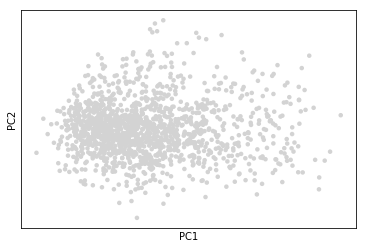

PCA plot for batch TGFB1


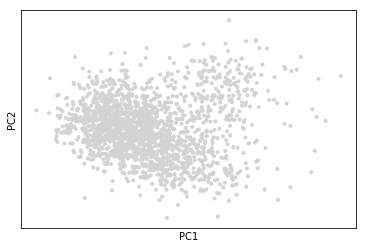

PCA plot for batch BMP9


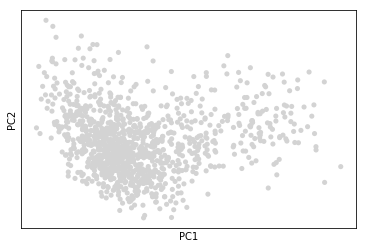

PCA plot for batch BMP9-TGFB1


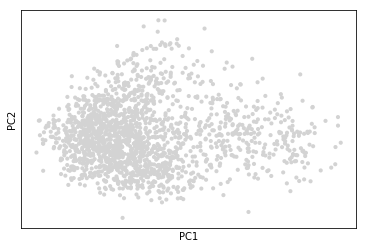

In [3]:
for batch, matrix in batches.items():
    print("PCA plot for batch", batch)
    sc.pl.pca(matrix)

## TGFB1-values in cells

We will check if TGFB1 is present in each of the batches. Then, we make a PCA-plot visualizing TGFB1-counts in the different batches.

TGFB1 present in batch control :  True
Printing TGFB1 PCA plot for batch control


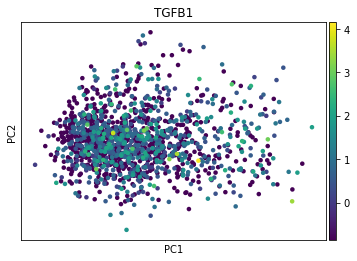

TGFB1 present in batch TGFB1 :  True
Printing TGFB1 PCA plot for batch TGFB1


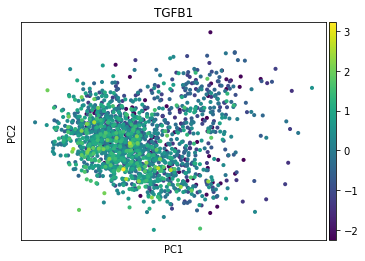

TGFB1 present in batch BMP9 :  True
Printing TGFB1 PCA plot for batch BMP9


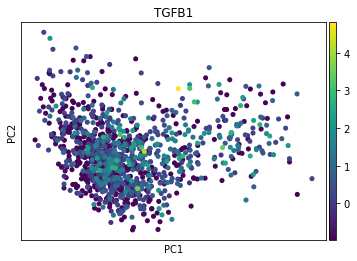

TGFB1 present in batch BMP9-TGFB1 :  True
Printing TGFB1 PCA plot for batch BMP9-TGFB1


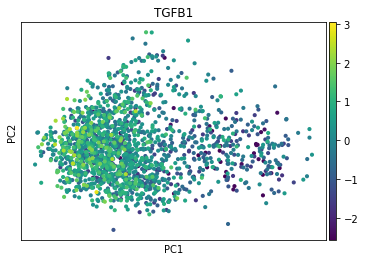

In [4]:
for batch, matrix in batches.items():
    present = any(matrix.var.gene_names == "TGFB1")
    print("TGFB1 present in batch", batch, ": ", present)
    
    if present:
        print("Printing TGFB1 PCA plot for batch", batch)
        sc.pl.pca(matrix, color="TGFB1")

Let's generate a variance ratio plot for each batch. This is useful because it provides insight into how much each PC contributes to the variance of the set. We can use this information as a cut-off for neighborhood graph calculations.

Printing PCA variance ratio for batch control


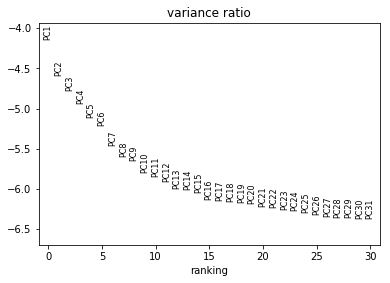

Printing PCA variance ratio for batch TGFB1


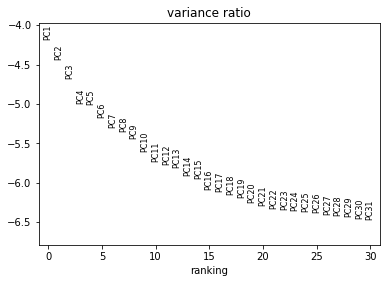

Printing PCA variance ratio for batch BMP9


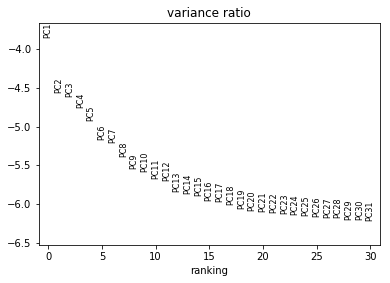

Printing PCA variance ratio for batch BMP9-TGFB1


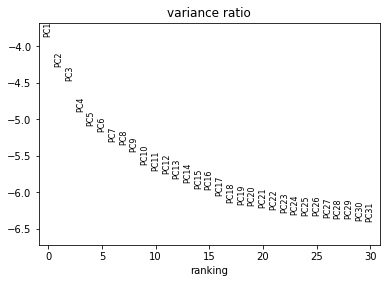

In [5]:
for batch, matrix in batches.items():
    print("Printing PCA variance ratio for batch", batch)
    sc.pl.pca_variance_ratio(matrix, log=True)

## Computing the neighborhood graph

We are computing the neighborhood graph on the cells per each batch, using the previously established principal components.

TODO: For the sake of reproducing Seurat's results, let's take the following values. more descriptive reason?

In [6]:
for batch, matrix in batches.items():
    print("Neighborhood graph calculation for batch", batch)
    sc.pp.neighbors(matrix, n_neighbors=10, n_pcs=40)

Neighborhood graph calculation for batch control
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:02)
Neighborhood graph calculation for batch TGFB1
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)
Neighborhood graph calculation for batch BMP9
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)
Neighborhood graph calculation for batch BMP9-TGFB1
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weight

## UMAP

We can use UMAP ([McInnes et al., 2018](https://arxiv.org/abs/1802.03426)) to get a two-dimensional representation of the neighborhood graph. This method is preferred over tSNE because (per the abstract) "\[it\] is competitive with t-SNE for visualization quality, and arguably preserves more of the global structure with superior run time performance."


In [7]:
for batch, matrix in batches.items():
    print("UMAP calculations for batch", batch)
    sc.tl.umap(matrix)

UMAP calculations for batch control
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:04)
UMAP calculations for batch TGFB1
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:04)
UMAP calculations for batch BMP9
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:02)
UMAP calculations for batch BMP9-TGFB1
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:03)


Create a list of marker genes that we want analyze more deeply:

In [8]:
MARKER_GENES = ("TGFB1", "TGFBR1", "TGFBR2", "SERPINE1", "ID3", "PLAUR", "ACTA2", "ACVRL1", "VIM", "S100A4", "SOX4",)

## Clustering the neighborhood graph

The Louvain clustering method is an effective way to find communities in large networks (such as the neighborhood graph previously computed) through modularity optimizations. The original paper is [Blondel et al. (2008)](https://doi.org/10.1088/1742-5468/2008/10/P10008) and it has been proposed for single-cell analysis by [Levine et al. (2015)](https://doi.org/10.1016/j.cell.2015.05.047).

In [9]:
for batch, matrix in batches.items():
    print("Running Louvain clustering on", batch)
    sc.tl.louvain(matrix)

Running Louvain clustering on control
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 7 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)
Running Louvain clustering on TGFB1
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 8 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)
Running Louvain clustering on BMP9
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 7 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)
Running Louvain clustering on BMP9-TGFB1
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 9 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)


We are expecting some of these clusters to highly correlate with the marker genes we named earlier for the S2 (treated) batch.

Plotting UMAP plot for Louvain clusters, as well as previous marker genes.
Found the following marker genes in batch control : ['TGFB1', 'TGFBR1', 'TGFBR2', 'SERPINE1', 'ID3', 'PLAUR', 'ACTA2', 'S100A4', 'SOX4']
Printing UMAP plots comparing Louvain clusters to marker genes in batch control


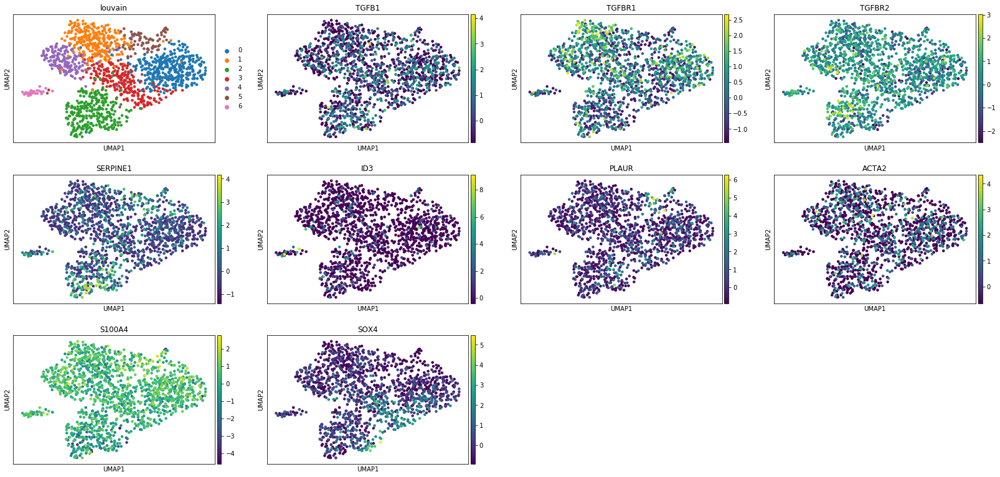

Plotting UMAP plot for Louvain clusters, as well as previous marker genes.
Found the following marker genes in batch TGFB1 : ['TGFB1', 'TGFBR1', 'TGFBR2', 'SERPINE1', 'ID3', 'PLAUR', 'ACTA2', 'S100A4', 'SOX4']
Printing UMAP plots comparing Louvain clusters to marker genes in batch TGFB1


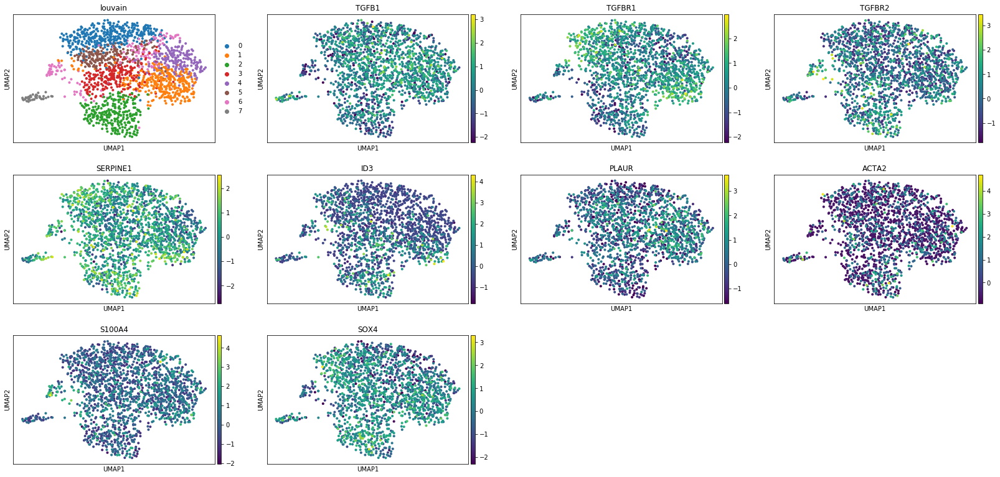

Plotting UMAP plot for Louvain clusters, as well as previous marker genes.
Found the following marker genes in batch BMP9 : ['TGFB1', 'TGFBR1', 'TGFBR2', 'SERPINE1', 'ID3', 'PLAUR', 'ACTA2', 'S100A4', 'SOX4']
Printing UMAP plots comparing Louvain clusters to marker genes in batch BMP9


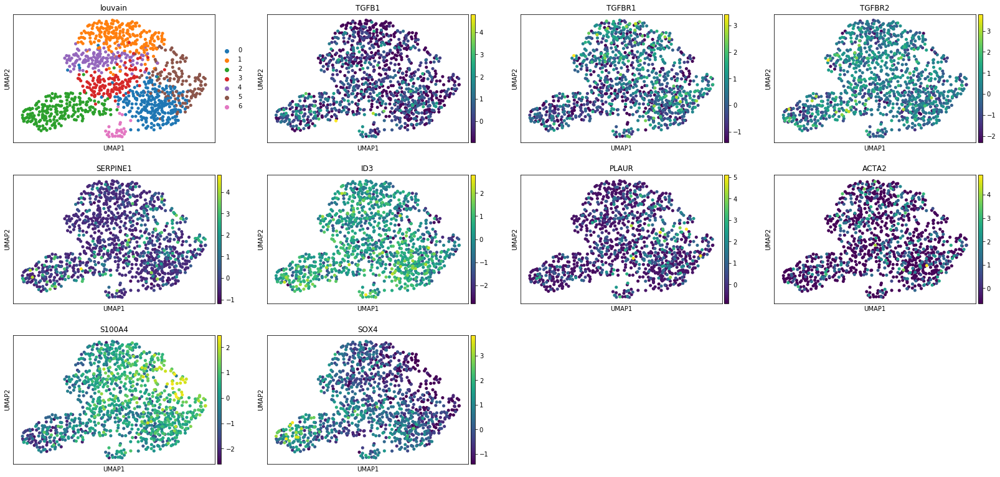

Plotting UMAP plot for Louvain clusters, as well as previous marker genes.
Found the following marker genes in batch BMP9-TGFB1 : ['TGFB1', 'TGFBR1', 'TGFBR2', 'SERPINE1', 'ID3', 'PLAUR', 'ACTA2', 'S100A4', 'SOX4']
Printing UMAP plots comparing Louvain clusters to marker genes in batch BMP9-TGFB1


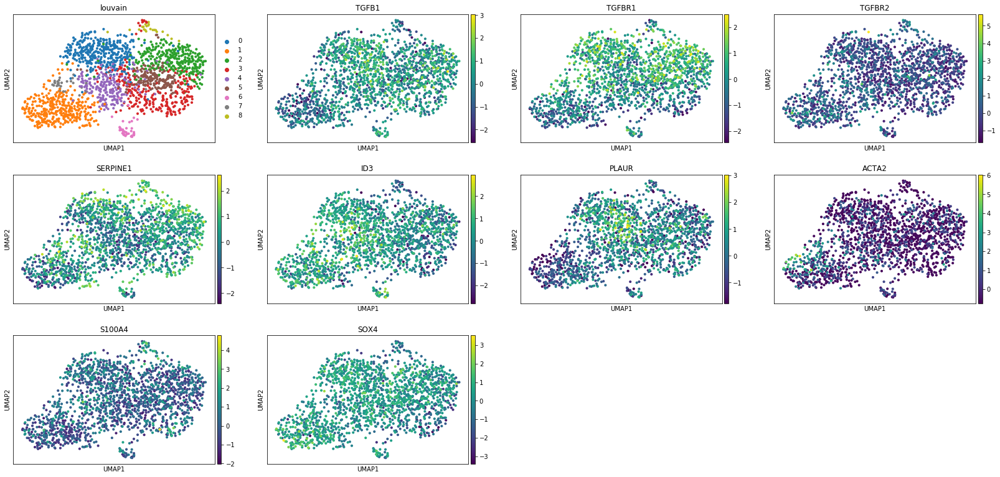

In [10]:
for batch, matrix in batches.items():
    print("Plotting UMAP plot for Louvain clusters, as well as previous marker genes.")
    filter_by = [var for var in MARKER_GENES if var in matrix.var_names]
    print("Found the following marker genes in batch", batch, ":", filter_by)
    filter_by.insert(0, "louvain")
    print("Printing UMAP plots comparing Louvain clusters to marker genes in batch", batch)
    sc.pl.umap(matrix, color=filter_by)

Compute signatures and interesting genes across clusters

In [16]:
# Signatures we will print colored charts for.
SIGNATURES = {"Alk5 signature": ['SERPINE1', 'CTGF', 'SMAD7', 'SMAD6','COMP', 'NOX4', 'PMEPA4', 'RUNX1', 'PIGF', 'TAGLN', 'IL6', 'IL11', 'GJA4', 'LTBP1'],
              "Alk1 signature": ['ID1', 'ID2', 'ID3', 'ID4', 'HAMP', 'PLAUR', 'SMAD6', 'HMGA2', 'IL8', 'EDN1', 'CXCL1', 'BMP6', 'HO1', 'JAG1', 'PTHLH', 'TLR4', 'RHOB', 'MAP3K5', 'ENG', 'COL5A1', 'HSP47', 'DDIT3', 'DNAJB1', 'HERPUD1', 'NEDD9', 'CRYAB', 'TPM1', 'LENG4', 'KPNA3', 'ANKRD15', 'SQLE', 'KDELR3', 'SCARA3', 'STAT1', 'IL1R1'],
              "Fibroblast signature": ['S100A4', 'VIM', 'COL1A1', 'COL3A1', 'TSLP', 'CXCL14', 'SERPINH1'],
              "SMC signature": ['ACTA2', 'CNN1', 'TAGLN', 'MYL9', 'MYH11', 'TAGLN2', 'MYOCDN', 'SMTN', 'SMAO', 'DES', 'LMOD1', 'P2X1', 'CRP1', 'CRP2', 'VCL', 'CALM1', 'MYLK', 'PP1', 'MYPT1', 'PPP1R12A'],
              "Osteo signature": ['RUNX2', 'OSX', 'ALPL', 'BSP', 'BGLAP', 'COL1A1', 'MSX2', 'SOX9', 'SOX5', 'DLX5', 'PIT1', 'PIT2', 'SOST'],
              "Ca2+ signature": ["ITPR1", "ITPR2", "ITPR3", "RYR1", "RYR2", "RYR3", "ATP2A1", "ATP2A2", "ATP2A3"],
              "Apoptosis signature": ['CASP1', 'CASP2', 'CASP3', 'CASP4', 'CASP5', 'CASP6', 'CASP7', 'CASP8', 'CASP9', 'CASP10', 'CASP11', 'CASP12', 'CASP13', 'CASP14', 'TP53', 'BCL2']}

# Genes across clusters we will print charts for.
GENES_ACROSS_CLUSTERS = ("JARID2", "SOX4", "PLAUR", "SERPINE1", "ID3", "CTGF", "S100A4", "CNN3", "PLAUR", "SERPINE1", "ACTA2")

Now working on batch control
Alk5 signature
Alk1 signature
Fibroblast signature
SMC signature
Osteo signature
Ca2+ signature
Apoptosis signature


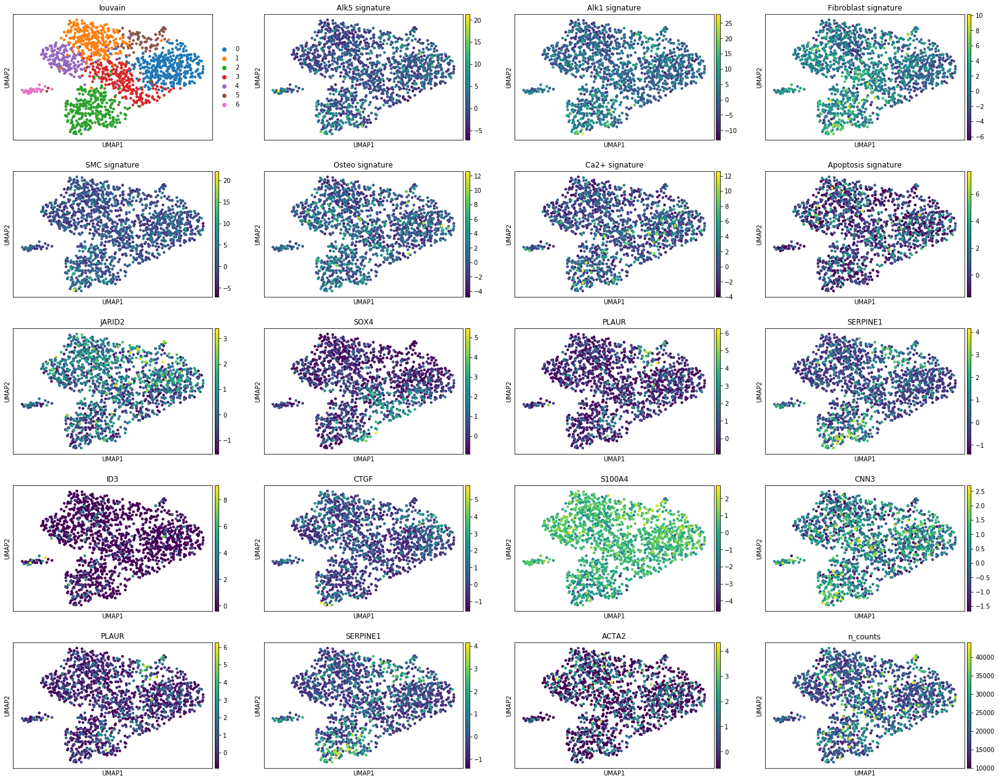

Now working on batch TGFB1
Alk5 signature
Alk1 signature
Fibroblast signature
SMC signature
Osteo signature
Ca2+ signature
Apoptosis signature


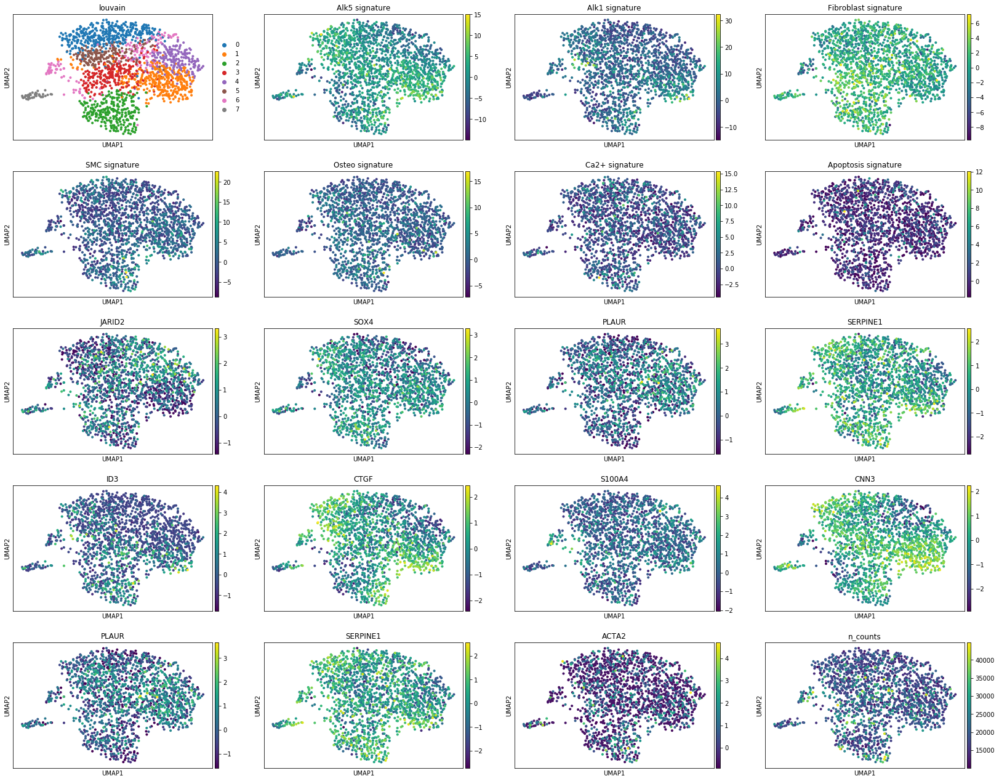

Now working on batch BMP9
Alk5 signature
Alk1 signature
Fibroblast signature
SMC signature
Osteo signature
Ca2+ signature
Apoptosis signature


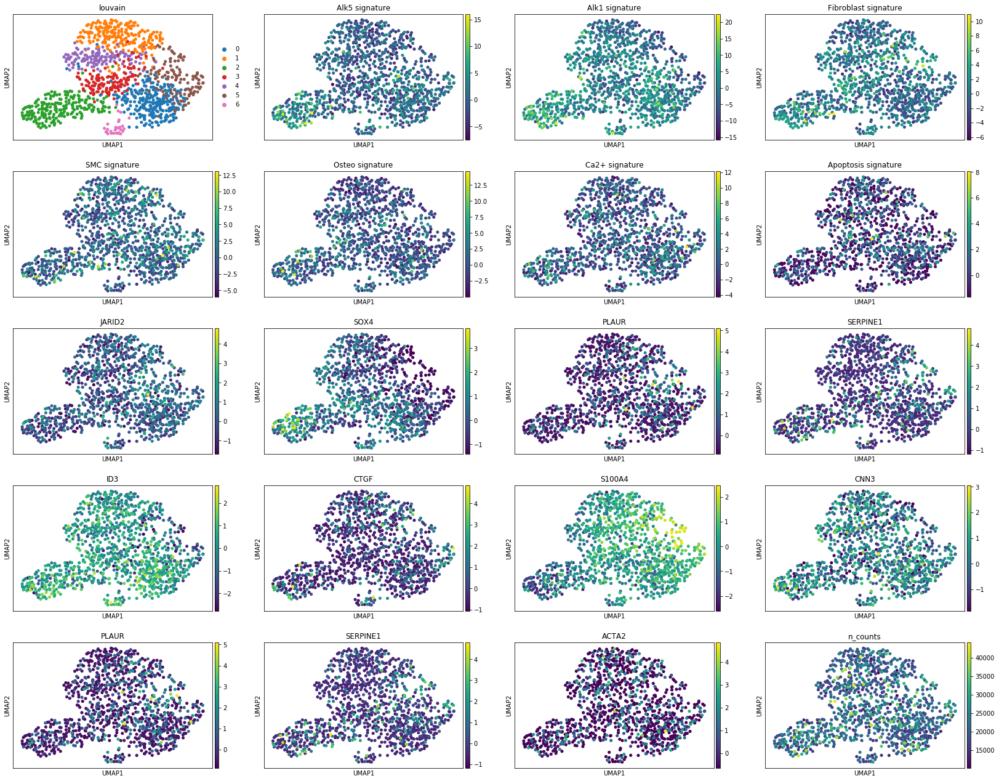

Now working on batch BMP9-TGFB1
Alk5 signature
Alk1 signature
Fibroblast signature
SMC signature
Osteo signature
Ca2+ signature
Apoptosis signature


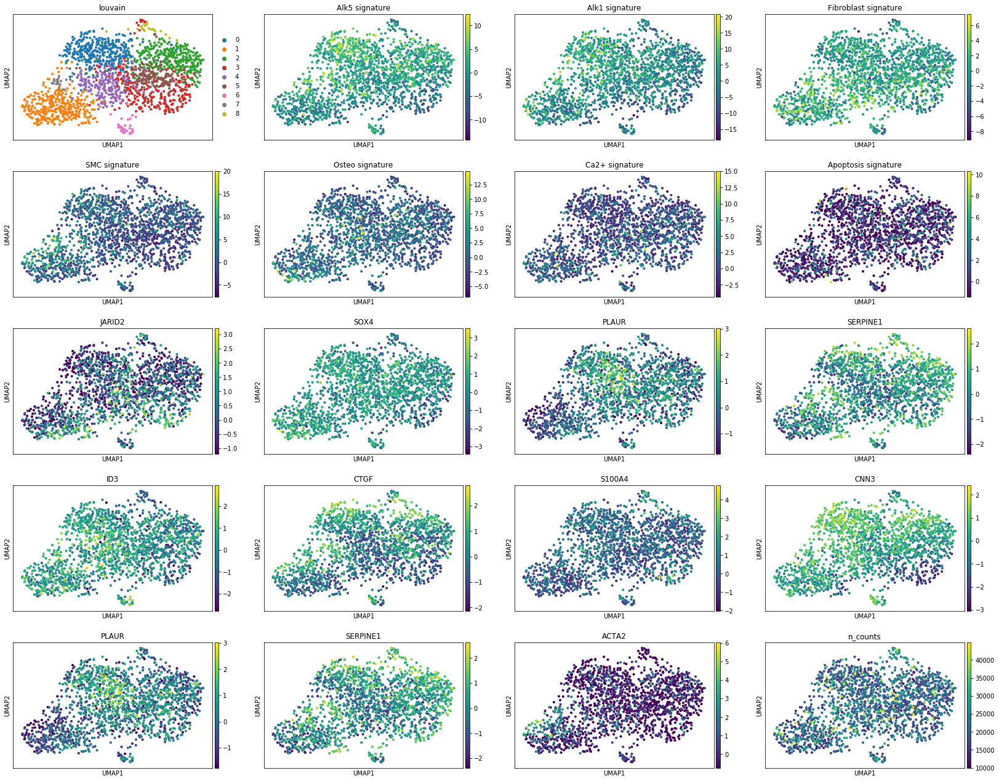

In [17]:
for batch, matrix in batches.items():
    print("Now working on batch", batch)
    for key, value in SIGNATURES.items():
        print(key)
        matrix.obs[key] = matrix[:, matrix.var.gene_names.isin(value)].X.sum(1)
    
    try:
        sc.pl.umap(matrix, color=['louvain'] + list(SIGNATURES.keys()) + list(GENES_ACROSS_CLUSTERS) + ["n_counts"])
    except Exception as e:
        print("error: ", e)
        pass

Compute violin plots for signatures and genes above:

Now working on batch control
violin plot for signature Alk5 signature


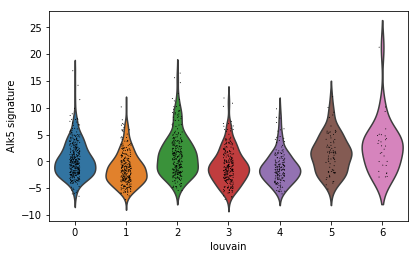

violin plot for signature Alk1 signature


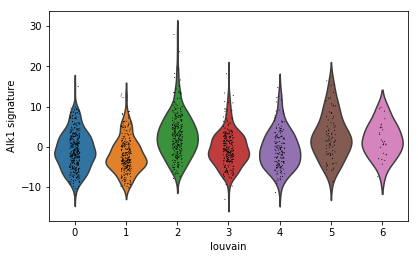

violin plot for signature Fibroblast signature


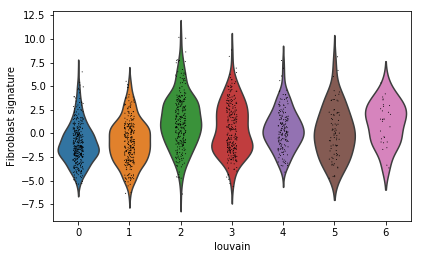

violin plot for signature SMC signature


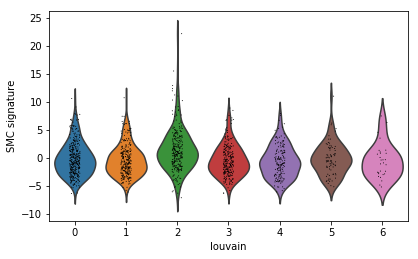

violin plot for signature Osteo signature


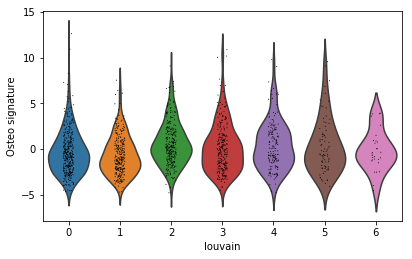

violin plot for signature Ca2+ signature


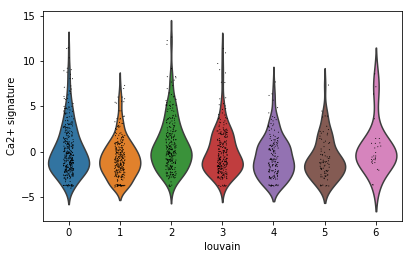

violin plot for signature Apoptosis signature


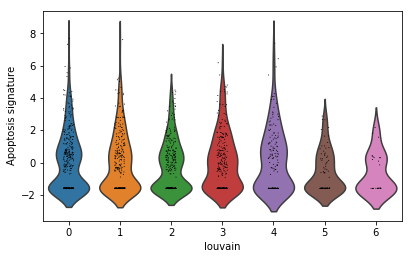

Now working on batch TGFB1
violin plot for signature Alk5 signature


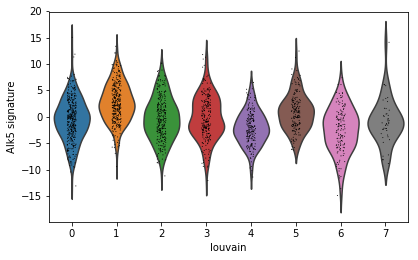

violin plot for signature Alk1 signature


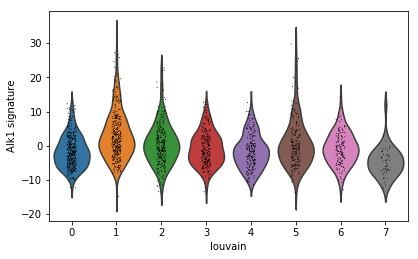

violin plot for signature Fibroblast signature


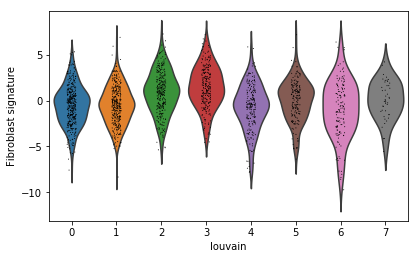

violin plot for signature SMC signature


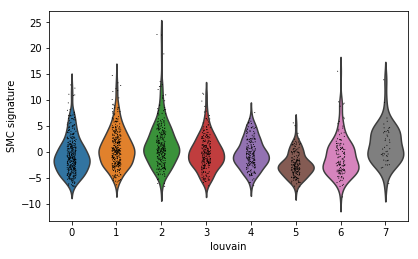

violin plot for signature Osteo signature


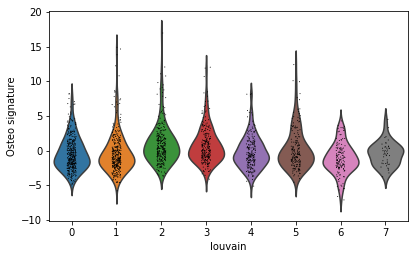

violin plot for signature Ca2+ signature


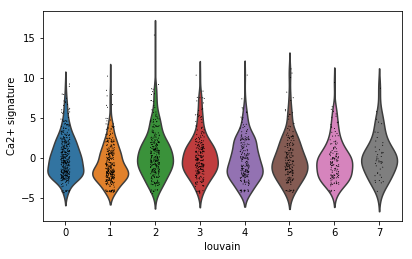

violin plot for signature Apoptosis signature


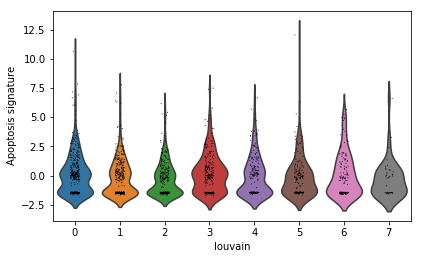

Now working on batch BMP9
violin plot for signature Alk5 signature


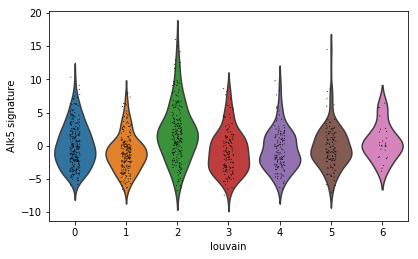

violin plot for signature Alk1 signature


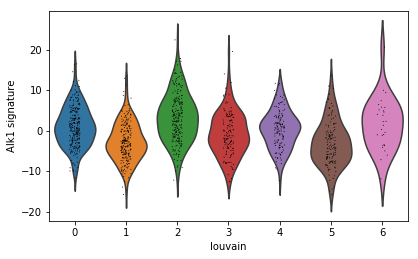

violin plot for signature Fibroblast signature


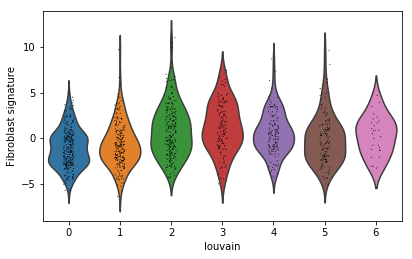

violin plot for signature SMC signature


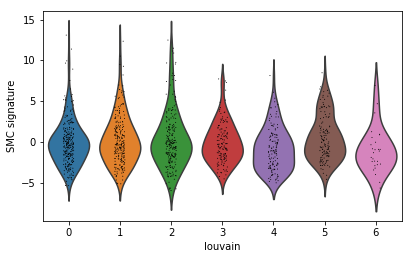

violin plot for signature Osteo signature


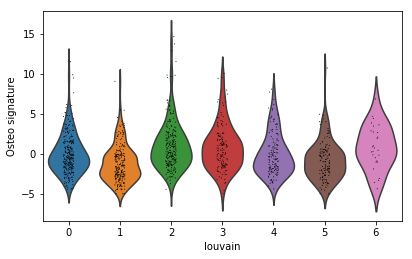

violin plot for signature Ca2+ signature


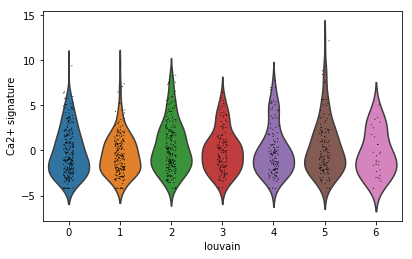

violin plot for signature Apoptosis signature


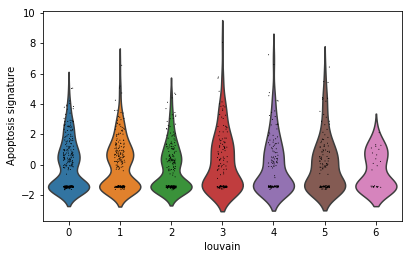

Now working on batch BMP9-TGFB1
violin plot for signature Alk5 signature


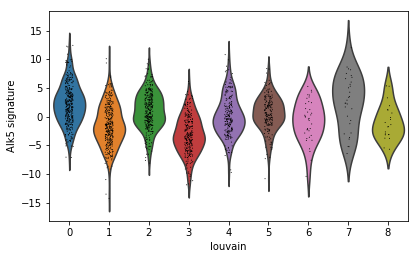

violin plot for signature Alk1 signature


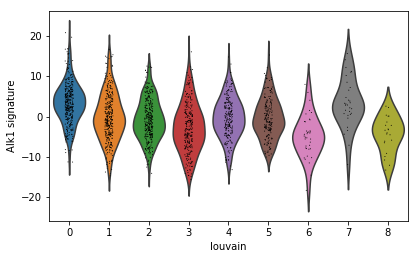

violin plot for signature Fibroblast signature


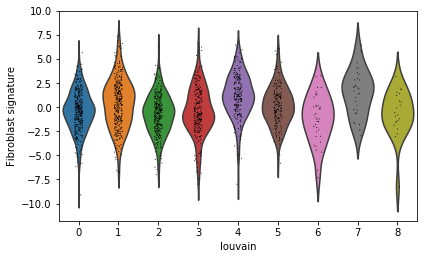

violin plot for signature SMC signature


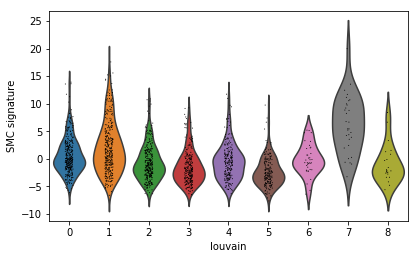

violin plot for signature Osteo signature


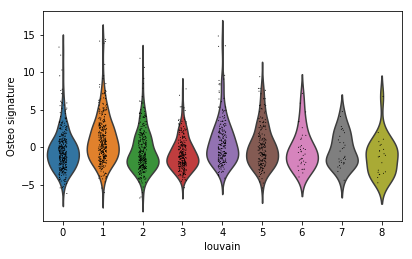

violin plot for signature Ca2+ signature


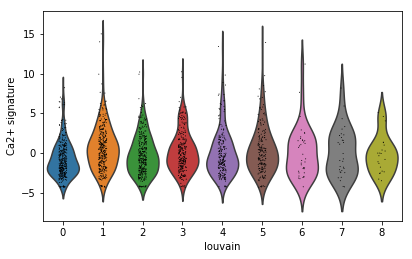

violin plot for signature Apoptosis signature


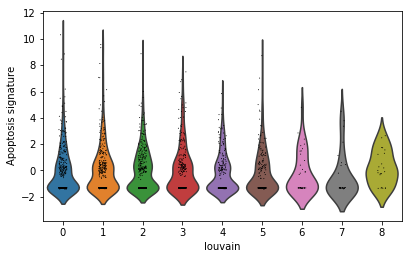

In [18]:
for batch, matrix in batches.items():
    print("Now working on batch", batch)
    for key, value in SIGNATURES.items():
        print("violin plot for signature", key)
        sc.pl.violin(matrix, [key], groupby='louvain')

Now working on batch control
plotting for JARID2 across clusters


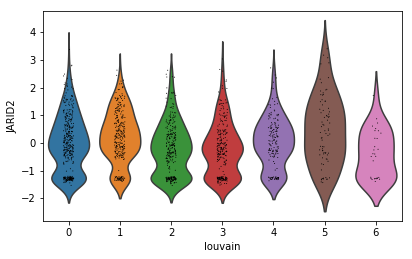

plotting for SOX4 across clusters


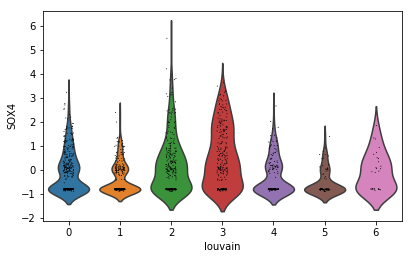

plotting for PLAUR across clusters


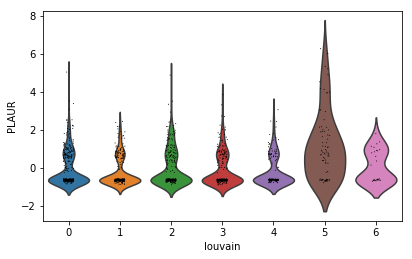

plotting for SERPINE1 across clusters


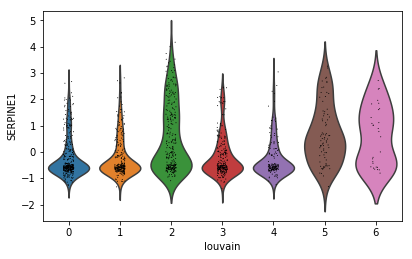

plotting for ID3 across clusters


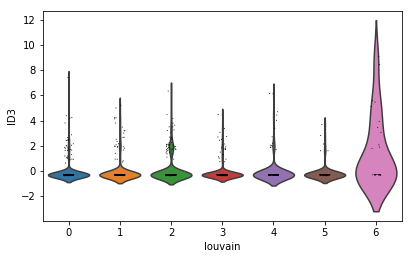

plotting for CTGF across clusters


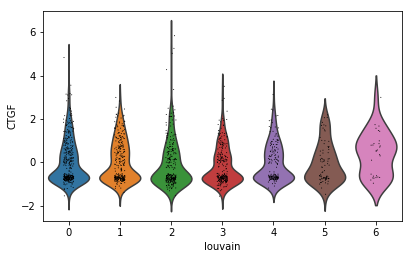

plotting for S100A4 across clusters


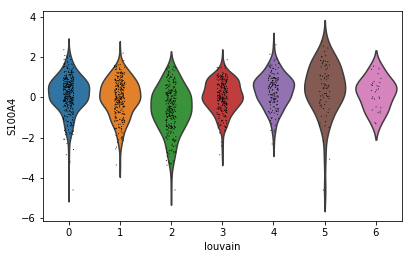

plotting for CNN3 across clusters


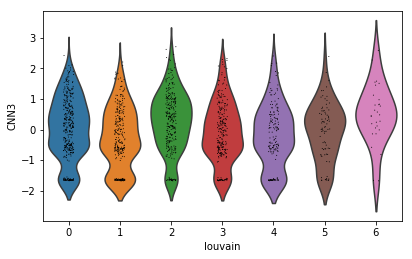

plotting for PLAUR across clusters


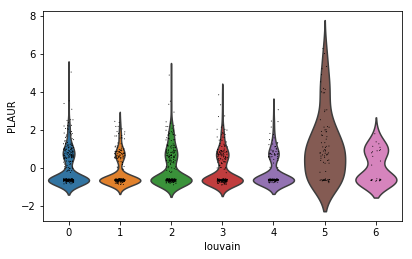

plotting for SERPINE1 across clusters


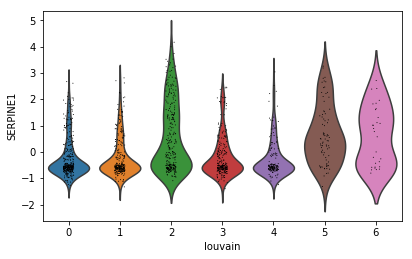

plotting for ACTA2 across clusters


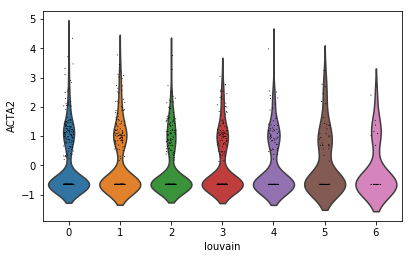

Now working on batch TGFB1
plotting for JARID2 across clusters


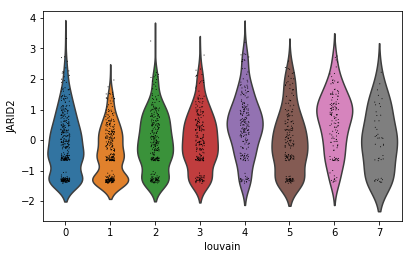

plotting for SOX4 across clusters


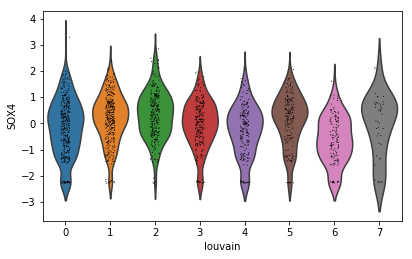

plotting for PLAUR across clusters


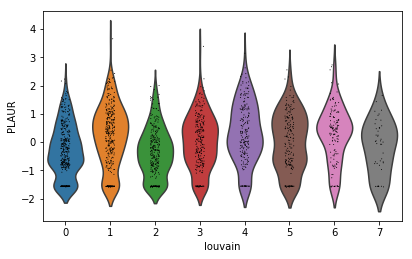

plotting for SERPINE1 across clusters


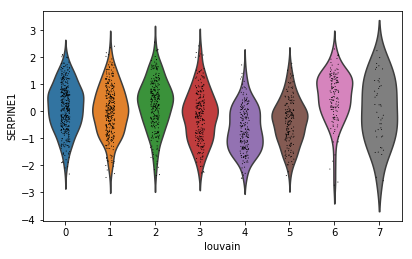

plotting for ID3 across clusters


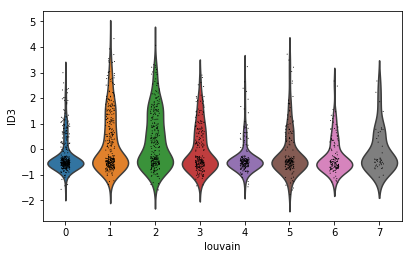

plotting for CTGF across clusters


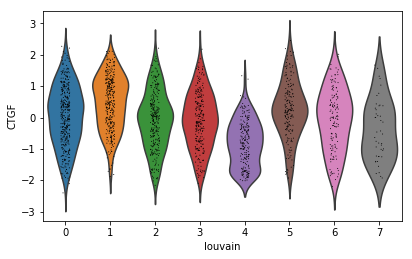

plotting for S100A4 across clusters


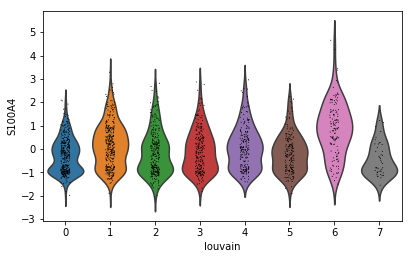

plotting for CNN3 across clusters


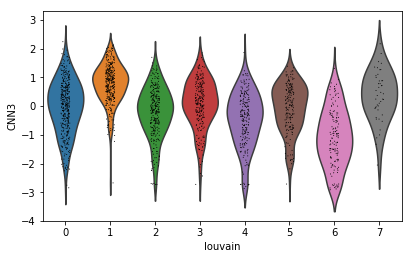

plotting for PLAUR across clusters


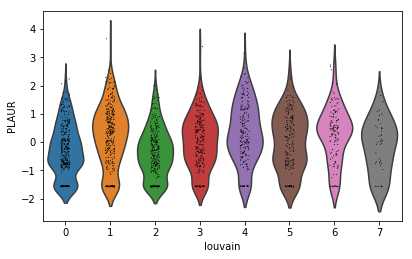

plotting for SERPINE1 across clusters


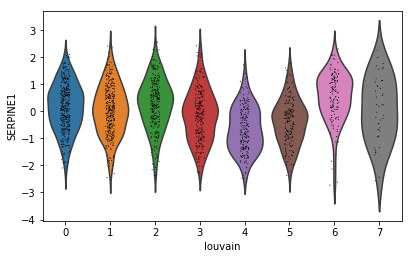

plotting for ACTA2 across clusters


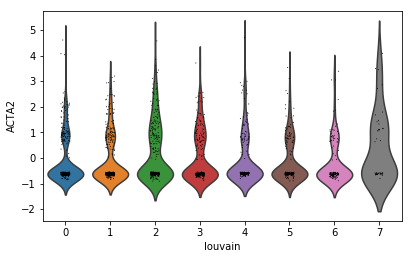

Now working on batch BMP9
plotting for JARID2 across clusters


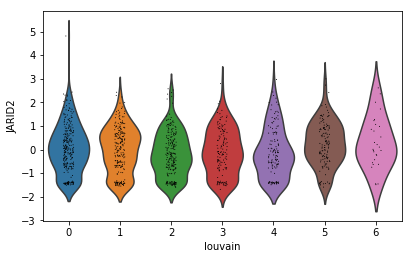

plotting for SOX4 across clusters


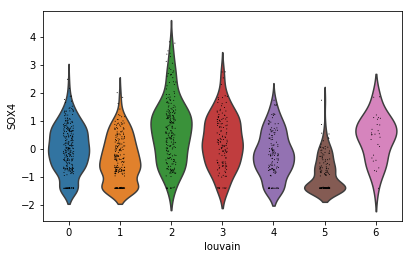

plotting for PLAUR across clusters


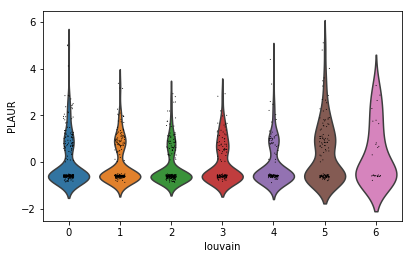

plotting for SERPINE1 across clusters


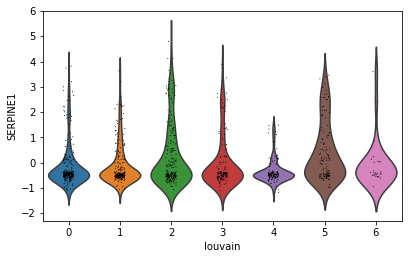

plotting for ID3 across clusters


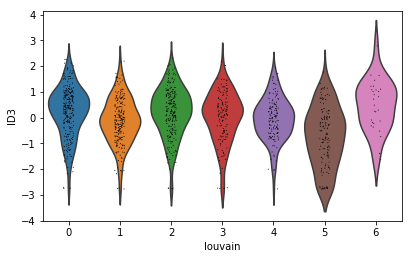

plotting for CTGF across clusters


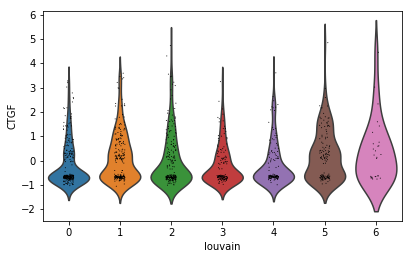

plotting for S100A4 across clusters


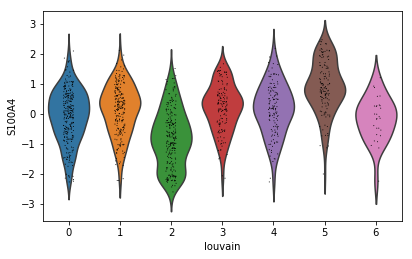

plotting for CNN3 across clusters


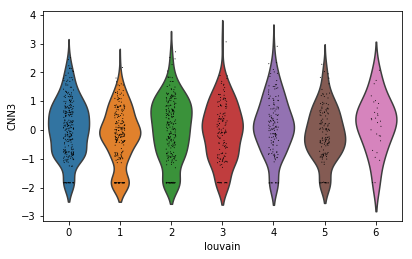

plotting for PLAUR across clusters


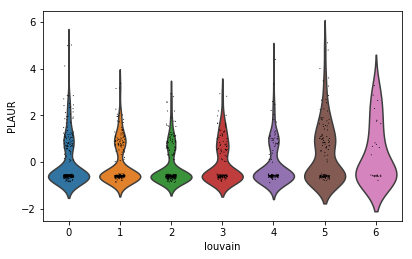

plotting for SERPINE1 across clusters


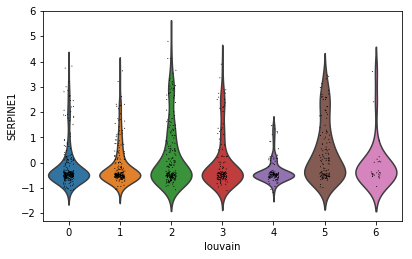

plotting for ACTA2 across clusters


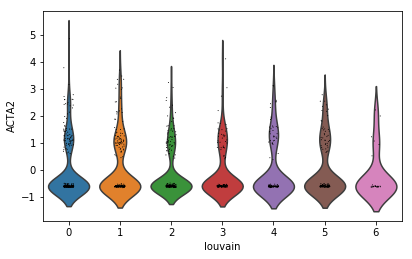

Now working on batch BMP9-TGFB1
plotting for JARID2 across clusters


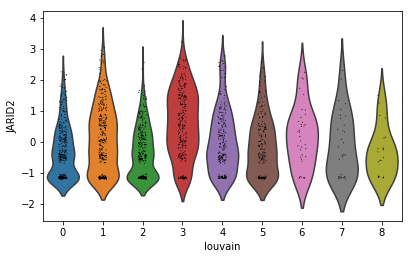

plotting for SOX4 across clusters


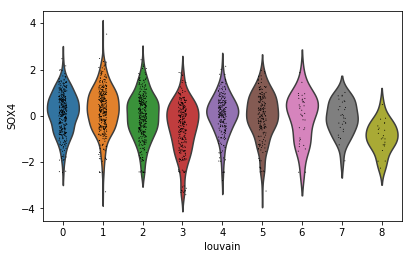

plotting for PLAUR across clusters


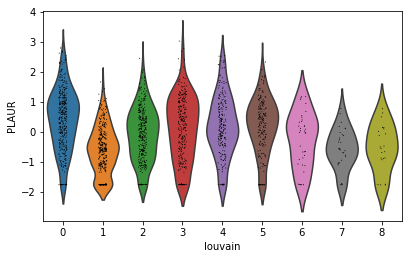

plotting for SERPINE1 across clusters


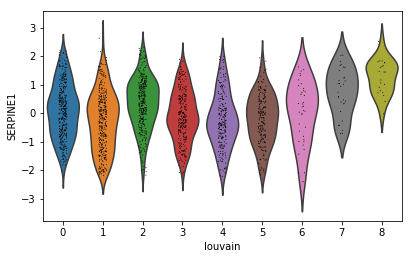

plotting for ID3 across clusters


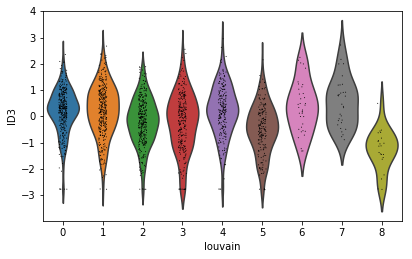

plotting for CTGF across clusters


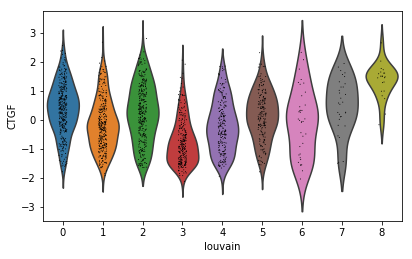

plotting for S100A4 across clusters


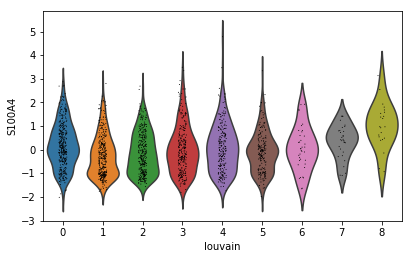

plotting for CNN3 across clusters


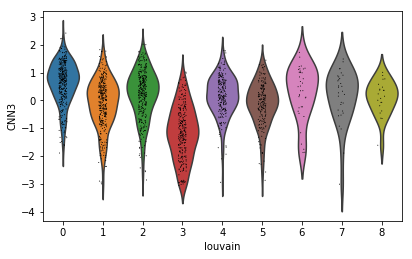

plotting for PLAUR across clusters


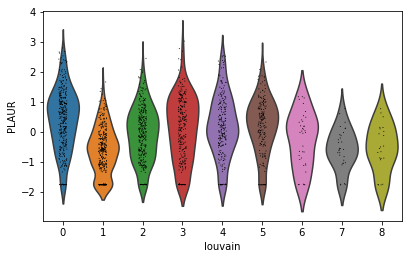

plotting for SERPINE1 across clusters


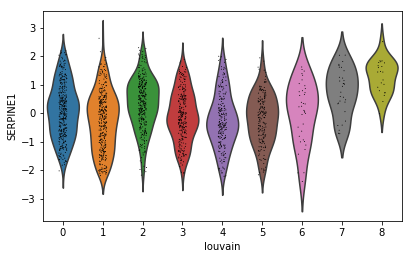

plotting for ACTA2 across clusters


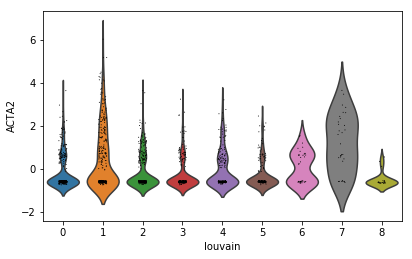

In [19]:
for batch, matrix in batches.items():
    print("Now working on batch", batch)
    
    for gene in GENES_ACROSS_CLUSTERS:
        try:
            print("plotting for", gene, "across clusters")
            sc.pl.violin(matrix, [gene], groupby='louvain')
        except:
            print("not found")

# Correlate gene expression

We specify some correlations we wish to plot in `(batch, x-axis, y-axis)` format and statistical correlations to compute in `(batch, gene_1, gene_2)`.

In [20]:
CORRELATIONS_TO_PLOT = [("TGFB1", "PLAUR", "SERPINE1")]

CORRELATIONS_TO_COMPUTE = [("control", "PLAUR", "SERPINE1"), ("TGFB1", "PLAUR", "SERPINE1"),
                          ("BMP9", "PLAUR", "SERPINE1"), ("BMP9-TGFB1", "PLAUR", "SERPINE1")]

Printing plot of correlations in batch TGFB1 across variables PLAUR SERPINE1


/usr/local/lib/python3.6/dist-packages/anndata/core/anndata.py:846: FutureWarning: In anndata v0.7+, arrays contained within an AnnData object will maintain their dimensionality. For example, prior to v0.7 `adata[0, 0].X` returned a scalar and `adata[0, :]` returned a 1d array, post v0.7 they will return two dimensional arrays. If you would like to get a one dimensional array from your AnnData object, consider using the `adata.obs_vector`, `adata.var_vector` methods or accessing the array directly.
  warn_flatten()


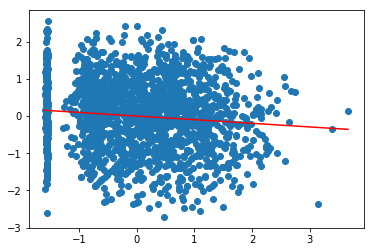

In [21]:
for batch, x_val, y_val in CORRELATIONS_TO_PLOT:
    print("Printing plot of correlations in batch", batch, "across variables", x_val, y_val)

    x = batches[batch][:,x_val].X
    y = batches[batch][:,y_val].X
    plt.scatter(x, y)
    plt.plot(np.unique(x), np.poly1d(np.polyfit(x, y, 1))(np.unique(x)), color="r")

In [23]:
for batch, x_val, y_val in CORRELATIONS_TO_COMPUTE:
    print("Printing correlations in batch", batch, "across variables", x_val, y_val)
    print(scipy.stats.spearmanr(batches[batch][:,x_val].X, batches[batch][:, y_val].X))

Printing correlations in batch control across variables PLAUR SERPINE1
SpearmanrResult(correlation=0.1843379905032091, pvalue=1.1969007743633891e-12)
Printing correlations in batch TGFB1 across variables PLAUR SERPINE1
SpearmanrResult(correlation=-0.09936265124652063, pvalue=2.2165513882876917e-05)
Printing correlations in batch BMP9 across variables PLAUR SERPINE1
SpearmanrResult(correlation=0.23394152136318808, pvalue=1.0072144455099653e-15)
Printing correlations in batch BMP9-TGFB1 across variables PLAUR SERPINE1
SpearmanrResult(correlation=-0.019633893253020618, pvalue=0.41000521073343277)


# Save to disk

In [24]:
for batch, matrix in batches.items():
    filename = "tgfb1-4-" + batch + ".h5ad"
    filename = os.path.join("write", filename)
    matrix.write(filename)